# Adult census data exploration

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from wordcloud import WordCloud

## Load data

In [3]:
column_names = ['age', 'workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 'occupation', 'relationship',
                'race', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country', 'income']
data = pd.read_csv('../dat/datasets/adult.data', names=column_names)
data.head(10)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
5,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
6,49,Private,160187,9th,5,Married-spouse-absent,Other-service,Not-in-family,Black,Female,0,0,16,Jamaica,<=50K
7,52,Self-emp-not-inc,209642,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,45,United-States,>50K
8,31,Private,45781,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Female,14084,0,50,United-States,>50K
9,42,Private,159449,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,5178,0,40,United-States,>50K


## Formal exploration

In [4]:
# dataset shapes
data.shape

(32561, 15)

age                int64
workclass         object
fnlwgt             int64
education         object
education-num      int64
marital-status    object
occupation        object
relationship      object
race              object
sex               object
capital-gain       int64
capital-loss       int64
hours-per-week     int64
native-country    object
income            object
dtype: object 

Object features uniques count
workclass      :  9
education      :  16
marital-status :  7
occupation     :  15
relationship   :  6
race           :  5
sex            :  2
native-country :  42
income         :  2


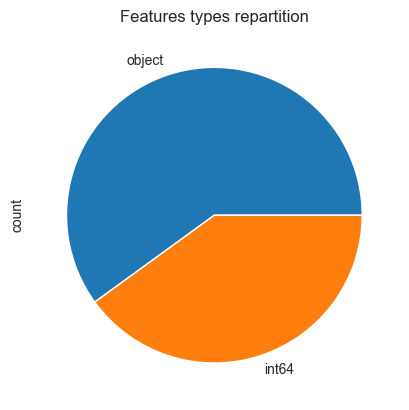

In [5]:
# features types
print(data.dtypes, '\n')
plt.figure()
data.dtypes.value_counts().plot.pie()
plt.title('Features types repartition')

print('Object features uniques count')
for obj_col in data.select_dtypes('object') :
    print(f"{f'{obj_col}' : <14} : ", len(data[obj_col].unique()))

Text(0.5, 1.0, 'Missing values')

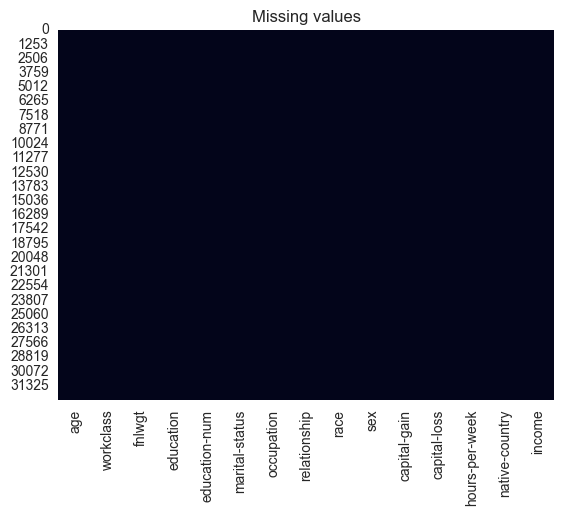

In [6]:
# missing values
sns.heatmap(data.isna(), cbar=False)
plt.title("Missing values")

## Deep exploration

<Axes: ylabel='count'>

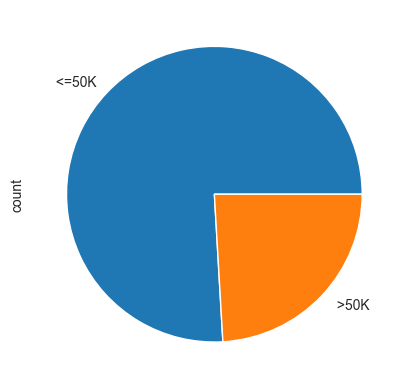

In [7]:
# target visualization
data.income.value_counts().plot.pie()

In [5]:
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
data_enc = data.copy()
data_enc = pd.DataFrame(OrdinalEncoder().fit_transform(data_enc), columns=data_enc.columns)

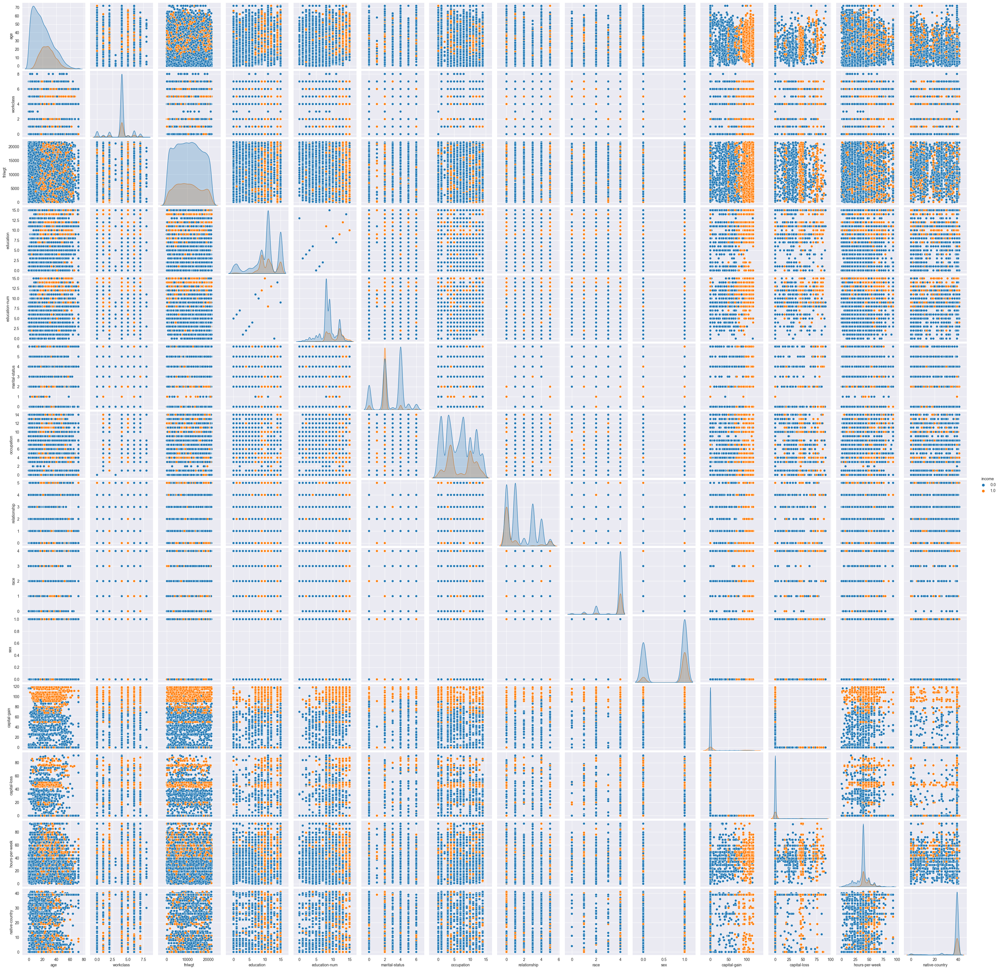

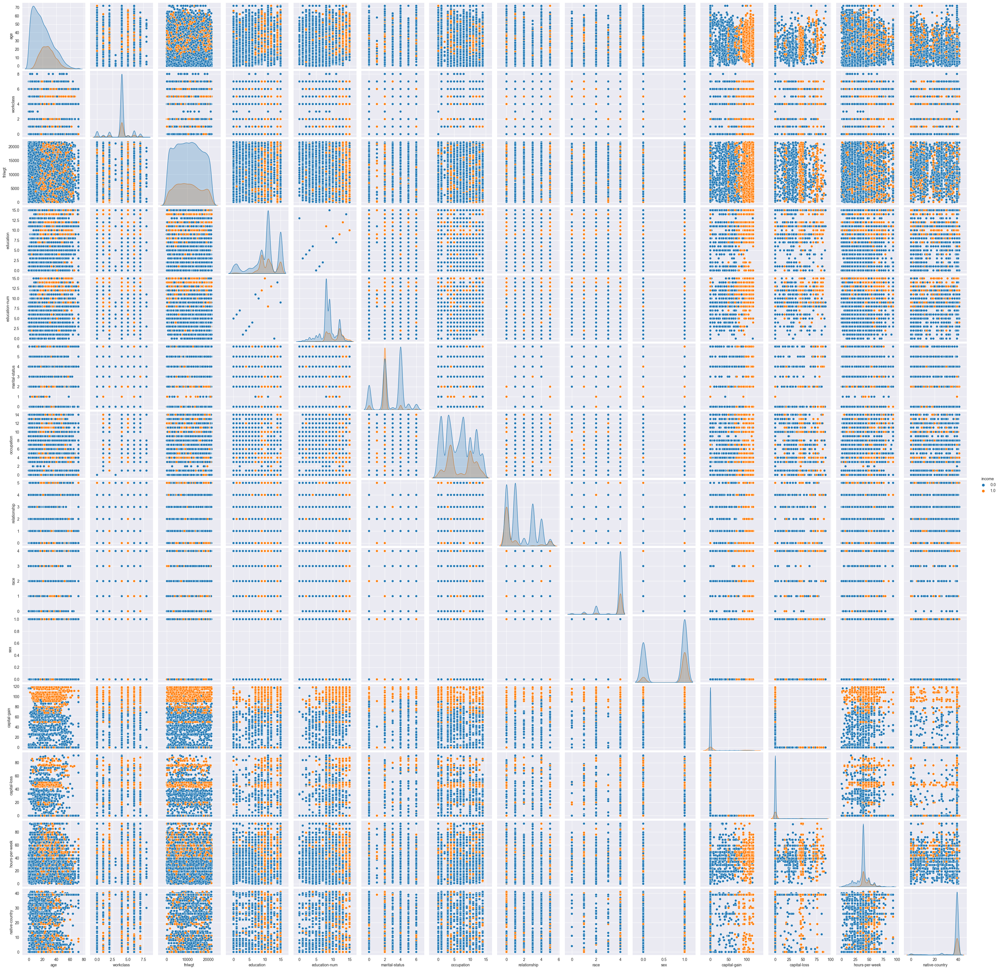

In [84]:
sns.pairplot(data_enc, hue='income')

<Axes: >

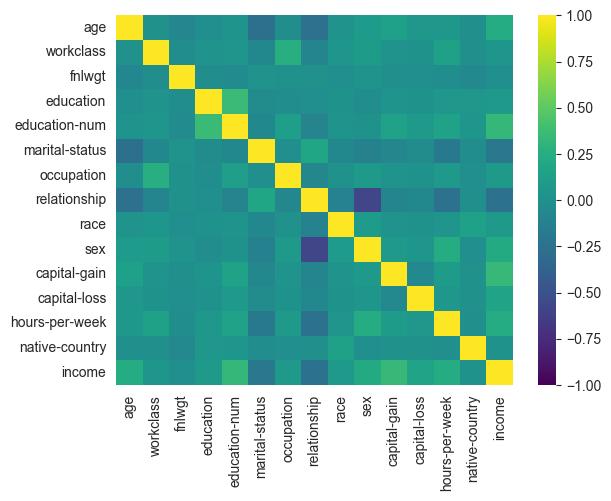

In [6]:
sns.heatmap(data_enc.corr(), cmap="viridis", vmin=-1, vmax=1)

## Fairness exploration

In [11]:
protected_attributes = ['sex', 'race', 'native-country', 'relationship', 'marital-status']

### Repartition exploration

In [7]:
# print sorted correlation to target
print(abs(data_enc.corr())['income'].sort_values(ascending=False))

income            1.000000
capital-gain      0.340016
education-num     0.335154
relationship      0.250918
age               0.234134
hours-per-week    0.232393
sex               0.215980
marital-status    0.199307
capital-loss      0.162514
education         0.079317
occupation        0.075468
race              0.071846
workclass         0.051604
native-country    0.015840
fnlwgt            0.010549
Name: income, dtype: float64


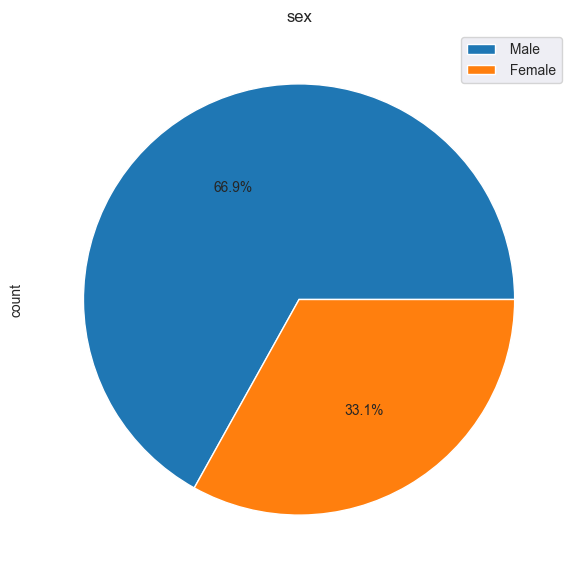

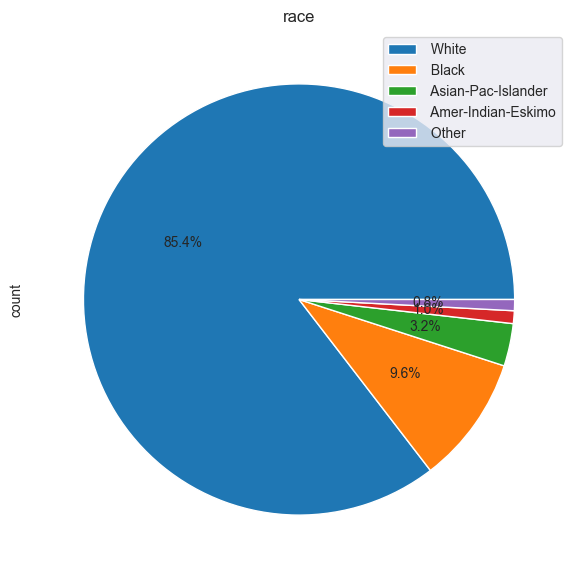

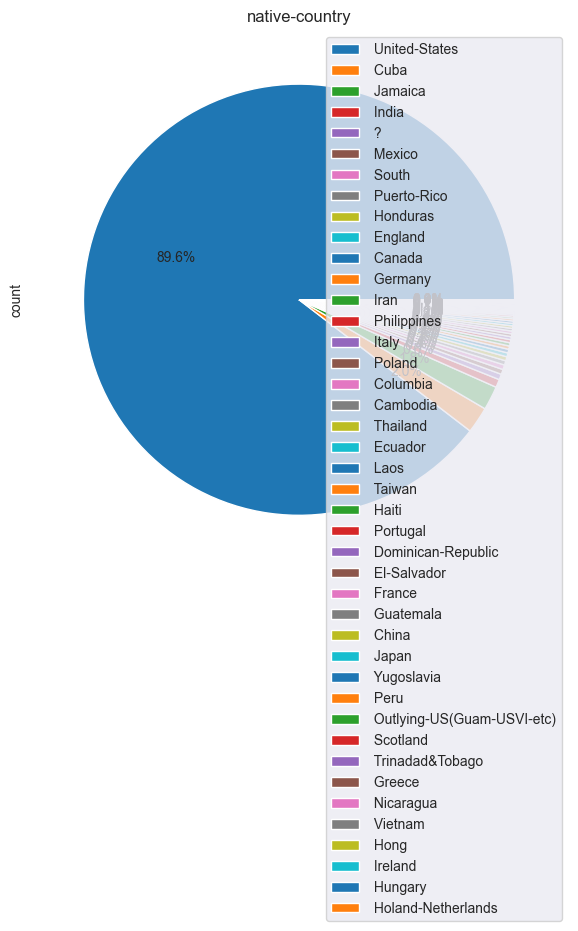

In [77]:
# plot protected attributes classes repartition
for attr in protected_attributes :
    plt.figure(figsize=(7,7))
    data[attr].value_counts().plot.pie(labels=None, autopct='%1.1f%%')
    plt.legend(loc='upper right', labels=data[attr].unique())
    plt.title(attr)
    bbox_to_anchor=(2.02, 1)

### K-Best Selection exploration

In [78]:
# First protected attribute to appear
for i in range(1, len(data.columns[:-1])):
    selector = SelectKBest(chi2, k=i)
    selector.fit_transform(data_enc.drop('income', axis=1), data.income)
    intersect = set(data.columns[:-1][selector.get_support()]).intersection(protected_attributes)
    if len(intersect) > 0:
        print(i, intersect)
        break

10 {'sex'}


In [135]:
# compute onehot encoded and rescaled dataset
data_oh = data.copy()
enc = OneHotEncoder(sparse_output=False)
columns_to_one_hot = data_oh.select_dtypes('object').columns[:-1]
encoded_array = enc.fit_transform(data_oh.loc[:, columns_to_one_hot])
data_encoded = pd.DataFrame(encoded_array, columns=enc.get_feature_names_out())
data_encoded = pd.concat([data_oh, data_encoded], axis=1)
data_encoded.drop(labels=columns_to_one_hot, axis=1, inplace=True)

protected_attributes = ['age', 'sex', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native-country_ ?', 'native-country_ Cambodia', 'native-country_ Canada',
                        'native-country_ China', 'native-country_ Columbia', 'native-country_ Cuba', 'native-country_ Dominican-Republic', 'native-country_ Ecuador', 'native-country_ El-Salvador', 'native-country_ England',
                        'native-country_ France', 'native-country_ Germany', 'native-country_ Greece', 'native-country_ Guatemala', 'native-country_ Haiti', 'native-country_ Holand-Netherlands', 'native-country_ Honduras',
                        'native-country_ Hong', 'native-country_ Hungary', 'native-country_ India', 'native-country_ Iran', 'native-country_ Ireland', 'native-country_ Italy', 'native-country_ Jamaica', 'native-country_ Japan',
                        'native-country_ Laos', 'native-country_ Mexico', 'native-country_ Nicaragua', 'native-country_ Outlying-US(Guam-USVI-etc)', 'native-country_ Peru', 'native-country_ Philippines', 'native-country_ Poland',
                        'native-country_ Portugal', 'native-country_ Puerto-Rico', 'native-country_ Scotland', 'native-country_ South', 'native-country_ Taiwan', 'native-country_ Thailand', 'native-country_ Trinadad&Tobago',
                        'native-country_ United-States', 'native-country_ Vietnam',]

scaled_data = pd.DataFrame(MinMaxScaler().fit_transform(data_encoded.drop('income', axis=1)),
                           columns=data_encoded.columns[:-1])



In [15]:
scaled_data = pd.DataFrame(MinMaxScaler().fit_transform(data_enc),
                           columns=data_enc.columns)

In [39]:
def cloud(word_list) :
    """
    Draw a WordCloud with a list of word
    :param word_list: list of string, first one => most important, last one => less important
    :return:
    """
    words = [word.replace(" ", "") for word in word_list[::-1]]
    freq = {mot: i+1 for i, mot in enumerate(words)}

    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=plt.cm.winter)

    wordcloud.generate_from_frequencies(freq)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')

In [16]:
# Compute K-Best apparition order for protected attribute
old_intersect = []
order = []
for i in range(1, len(scaled_data.columns[:-1])):
    selector = SelectKBest(chi2, k=i)
    selector.fit_transform(scaled_data, scaled_data.income)
    intersect = set(scaled_data.columns[selector.get_support()]).intersection(protected_attributes)
    if len(intersect) > len(old_intersect):
        order.append(list(set(intersect) - set(old_intersect))[0])
        old_intersect = intersect

In [17]:
# Compute K-Best apparition order for all attribute
old_intersect = []
order_full = []
for i in range(1, len(scaled_data.columns[:-1])):
    selector = SelectKBest(chi2, k=i)
    selector.fit_transform(scaled_data, scaled_data.income)
    intersect = set(scaled_data.columns[selector.get_support()]).intersection(scaled_data.columns)
    order_full.append(list(set(intersect) - set(old_intersect))[0])
    old_intersect = intersect

order_full.remove('income')

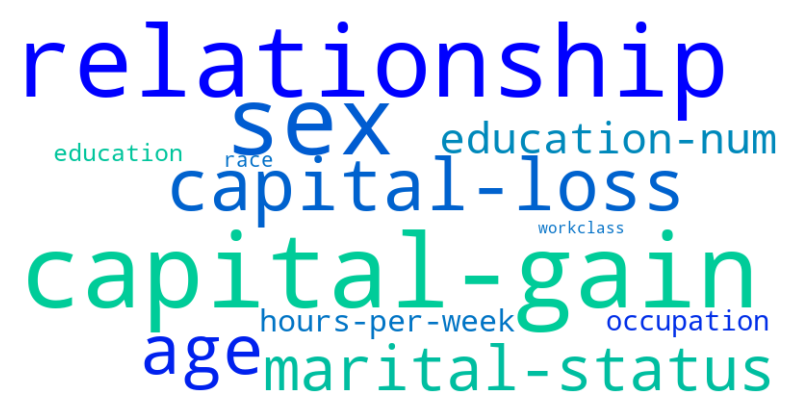

In [40]:
cloud(order_full)

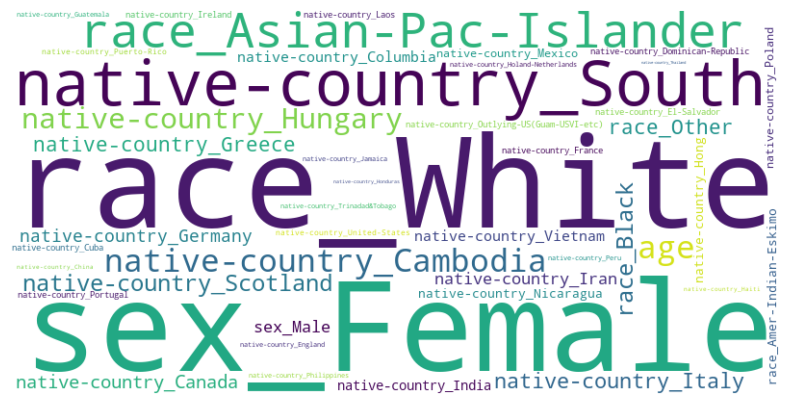

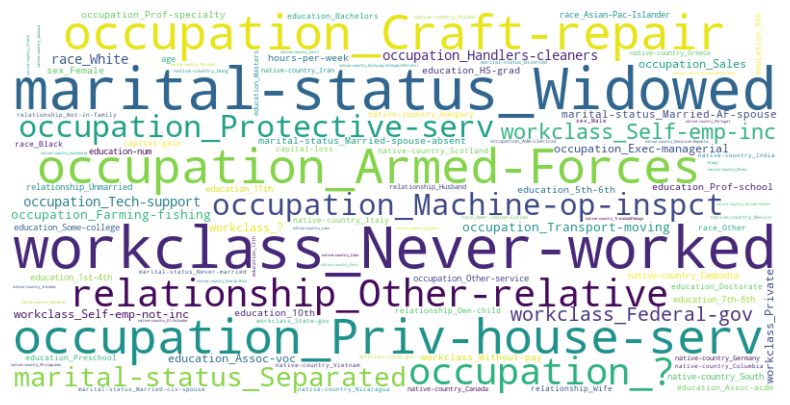

In [143]:
# print clouds
cloud(order)
cloud(order_full)